# Part(1): Улучшаем Isolation Forest (40 баллов)


## 0. Utils


In [1]:
import pandas as pd
import numpy as np
import json

import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (23, 9)

import warnings

warnings.filterwarnings("ignore")

# For adtk
import matplotlib.style as mplstyle

if "seaborn-v0_8-whitegrid" in mplstyle.library:
    mplstyle.library["seaborn-whitegrid"] = mplstyle.library["seaborn-v0_8-whitegrid"]


def seed_everything(seed: int):
    import random, os
    import numpy as np

    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)


seed_everything(4)

In [2]:
from etna.datasets import TSDataset
from etna.analysis import plot_anomalies as plot_anomalies_etna
from adtk.visualization import plot
from adtk.metrics import recall, precision, f1_score

In [3]:
def convert_to_etna(df):
    df_etna = df_etna = pd.melt(
        pd.DataFrame(df).reset_index(),
        id_vars="timestamp",
        value_vars=[f"segment_{i}" for i in range(1, 8)],
        var_name="segment",
        value_name="target",
    )
    return df_etna


def anomaly_dict_to_mask(df, anomaly_dict):
    """Convert anomaly_dict (segment -> timestamps) to a 0/1 mask aligned to df.index.

    Some ETNA detectors may return timestamps outside df.index (e.g. because of internal trimming).
    We intersect indices to avoid KeyError and keep evaluation stable.
    """
    df_mask = df.copy()
    df_mask[:] = 0
    for segment, indexes in anomaly_dict.items():
        if segment not in df_mask.columns:
            continue
        valid_idx = df_mask.index.intersection(indexes)
        if len(valid_idx) == 0:
            continue
        df_mask.loc[valid_idx, segment] = 1
    return df_mask


def eval_etna(df, anomaly_dict):
    anomalies_mask = anomaly_dict_to_mask(df, anomaly_dict)

    plot_anomalies_etna(ts, anomaly_dict)
    metrics, metrics_agg = eval_metrics(
        df_anomaly, anomalies_mask, metrics_list=[precision, recall, f1_score]
    )
    return metrics, metrics_agg, anomalies_mask


def eval_metrics(y_true, y_pred, metrics_list):
    metrics = {}
    metrics_agg = {}
    for metric in metrics_list:
        name = metric.__name__
        metrics[name] = metric(y_true, y_pred)
        metrics_agg[name] = pd.Series(metric(y_true, y_pred)).mean()

    return metrics, metrics_agg


def plot_anomalies(series, detector):
    try:
        anomalies = detector.fit_detect(series)
    except:
        anomalies = detector.detect(series)

    metrics, metrics_agg = eval_metrics(
        df_anomaly, anomalies, metrics_list=[precision, recall, f1_score]
    )
    plot(
        series,
        anomaly=anomalies,
        ts_linewidth=1,
        ts_markersize=3,
        anomaly_markersize=5,
        anomaly_color="red",
        anomaly_tag="marker",
    )
    return metrics, metrics_agg, anomalies

## 1. Даныне

Будем использовать данные с семинара


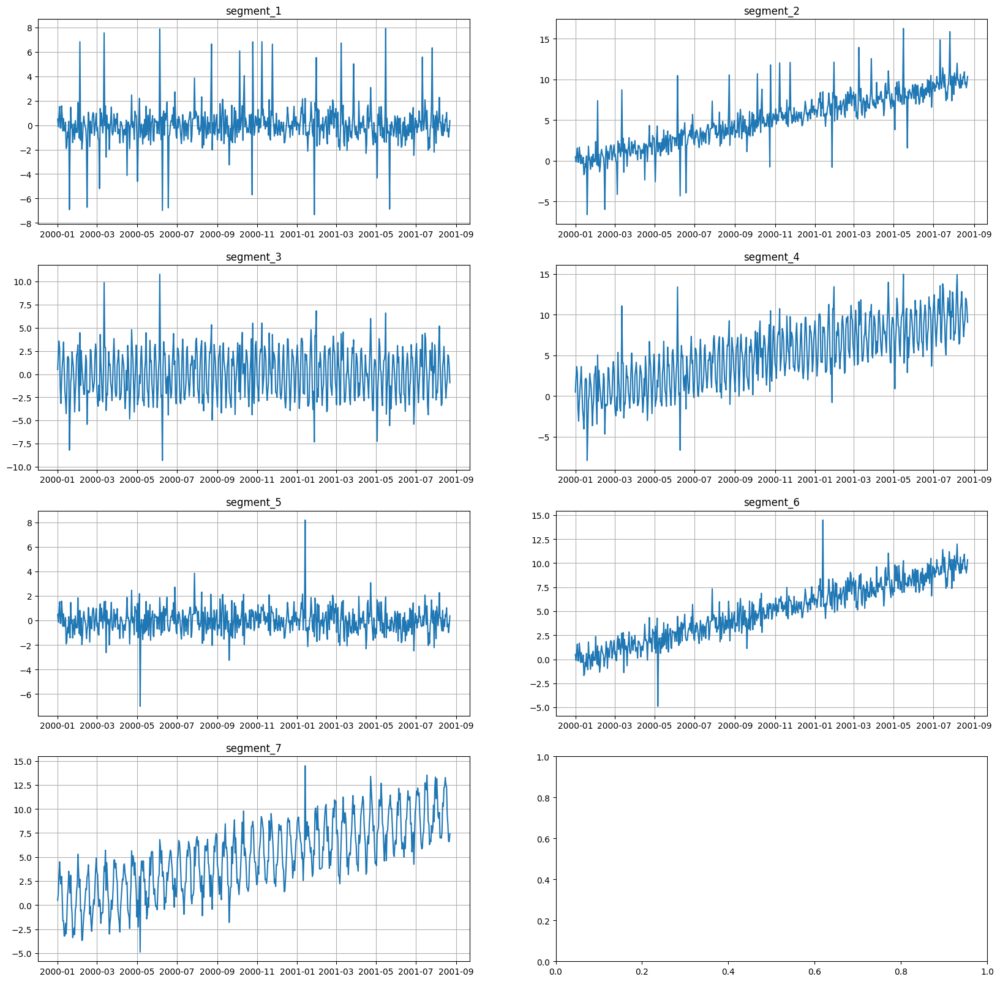

In [4]:
df = pd.read_csv(
    "https://gist.githubusercontent.com/alex-hse-repository/5a85c74e2edd4f126e7ad73cee59a485/raw/72b384254d95961f21106b85276c515fc5ab225f/data.csv"
)
df["timestamp"] = pd.to_datetime(df["timestamp"])
df = df.set_index("timestamp")

df_anomaly = pd.read_csv(
    "https://gist.githubusercontent.com/alex-hse-repository/5a85c74e2edd4f126e7ad73cee59a485/raw/72b384254d95961f21106b85276c515fc5ab225f/anomaly.csv"
)
df_anomaly["timestamp"] = pd.to_datetime(df_anomaly["timestamp"])
df_anomaly = df_anomaly.set_index("timestamp")

df_etna = convert_to_etna(df)
ts = TSDataset(df=df_etna, freq="D")
ts.plot()

## 2. Дефолтный вариант(с семинара)


{'precision': 0.15870079071195226,
 'recall': 0.8791208791208792,
 'f1_score': 0.24157247757588746}

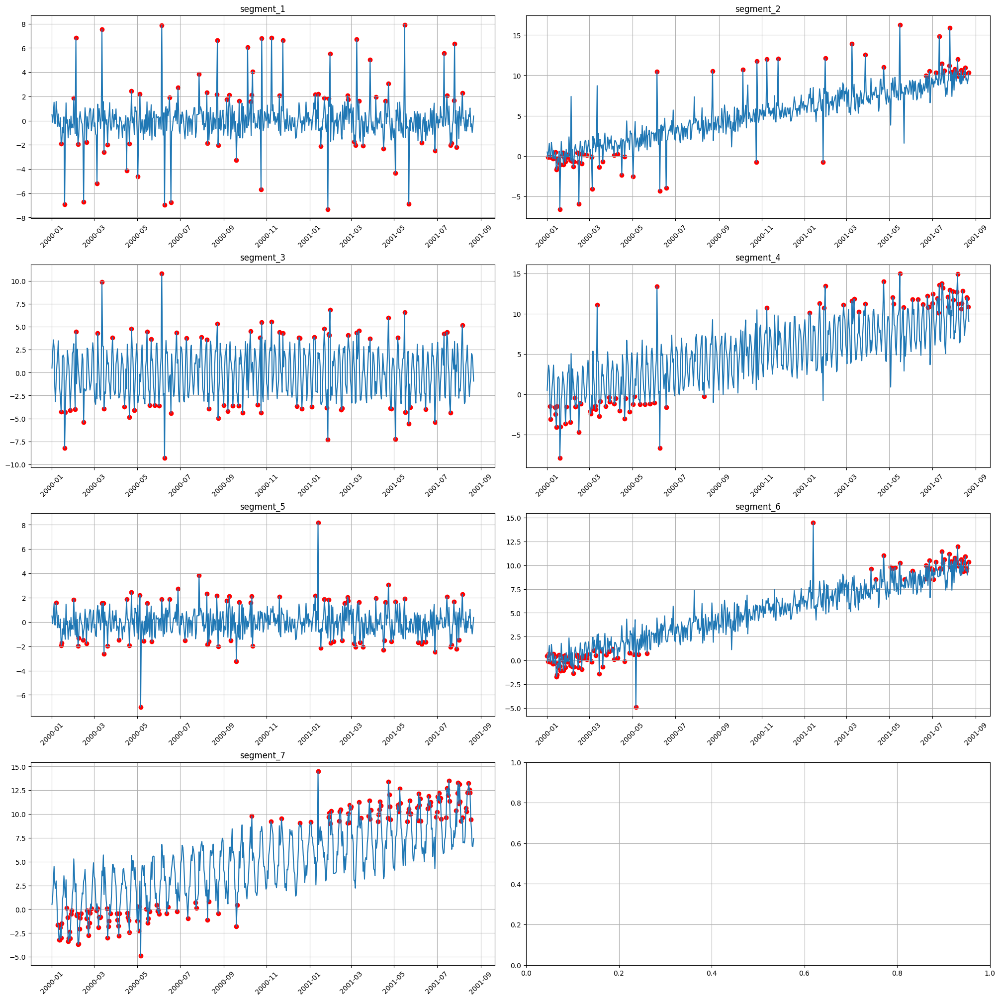

In [5]:
from etna.analysis import get_anomalies_isolation_forest

anomaly_dict = get_anomalies_isolation_forest(ts, random_state=4)
metrics_if, metrics_agg_if, anomalies_if = eval_etna(df, anomaly_dict)
metrics_agg_if

## 3. Убираем тренд

Попробуем убрать тренд из рядов


In [6]:
from etna.transforms import LinearTrendTransform

In [7]:
trend_transform = LinearTrendTransform(in_column="target")  # <your code here>\n
ts.fit_transform([trend_transform])

{'precision': 0.18957177465580827,
 'recall': 0.9230769230769231,
 'f1_score': 0.28237927418086767}

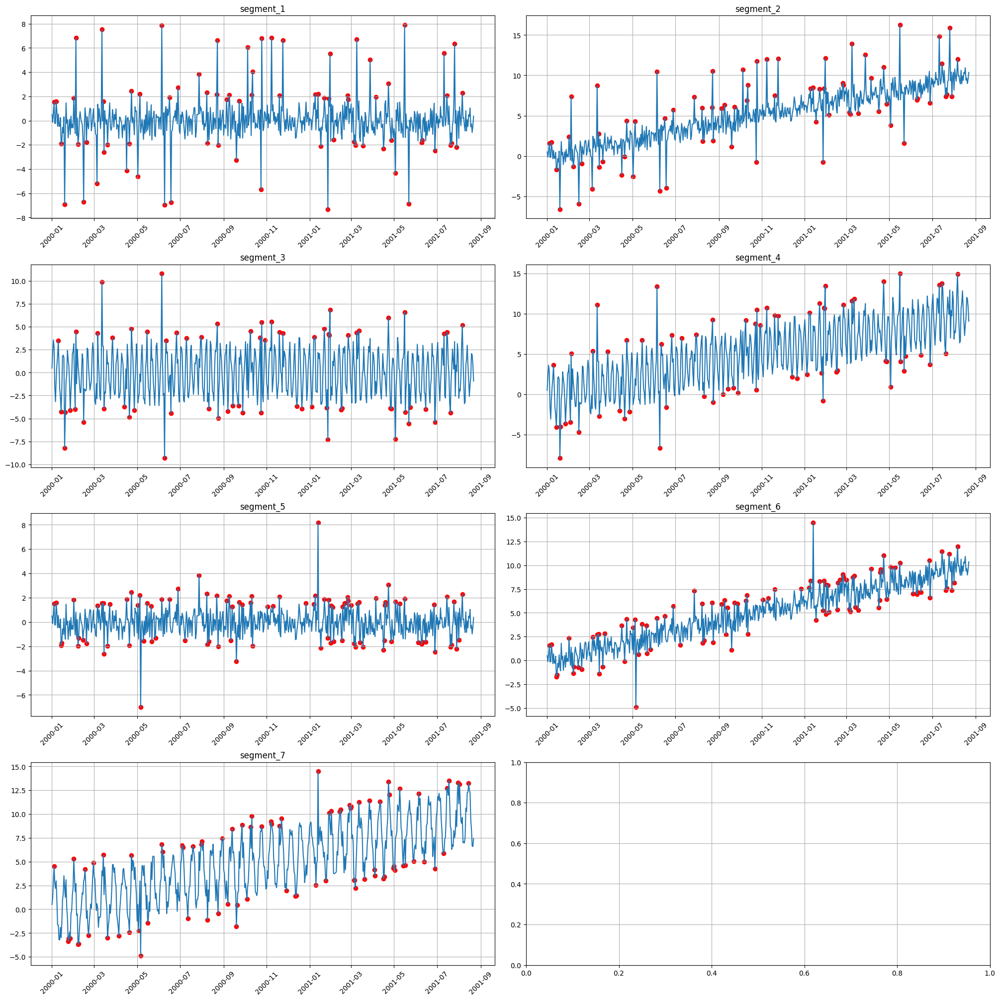

In [8]:
anomaly_dict = get_anomalies_isolation_forest(
    ts, features_to_use=["target"], random_state=4
)
ts.inverse_transform([trend_transform])

metrics_if_det, metrics_agg_if_det, anomalies_if_det = eval_etna(df, anomaly_dict)
metrics_agg_if_det

In [9]:
result = {
    "if_trend_f1_score": metrics_agg_if_det["f1_score"],  # >= 0.28
}
print(json.dumps(result))

{"if_trend_f1_score": 0.28237927418086767}


## 4. Добавляем признаки

На первом семинаре мы научились доставать компоненты из модели HotlWinters -- попробуем использовать их в качестве признаков

**Замечание:** в идеале нужно разбить датасет на несоклько по периоду сезонности чтобы оценить сезонную компоненту более корректно, однако сейчас мы на это забьем


In [10]:
from etna.models import HoltWintersModel
from etna.transforms import ModelDecomposeTransform

In [11]:
model_decompose = ModelDecomposeTransform(
    model=HoltWintersModel(),
    in_column="target",
)

ts.fit_transform([model_decompose])

c:\Users\chizh\Desktop\Магистратура\MLOps_course\ml_env\Lib\site-packages\statsmodels\tsa\holtwinters\model.py:903: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [12]:
ts.head()

segment    segment_1              segment_2              segment_3  \
feature       target target_level    target target_level    target   
timestamp                                                            
2000-01-01  0.496714     0.026481  0.496714     0.131041  0.496714   
2000-01-02 -0.138264     0.026481 -0.121598     0.156032  2.207230   
2000-01-03  0.647689     0.026481  0.681022     0.137058  3.572472   
2000-01-04  1.523030     0.026481  1.573030     0.174234  2.824681   
2000-01-05 -0.234153     0.026481 -0.167487     0.269831 -1.535805   

segment                 segment_4              segment_5               \
feature    target_level    target target_level    target target_level   
timestamp                                                               
2000-01-01     0.035265  0.496714     0.317251  0.496714    -0.013519   
2000-01-02     0.035265  2.223897     0.325493 -0.138264    -0.013519   
2000-01-03     0.035265  3.605806     0.412683  0.647689    -0.013519   
2000-01-04     0.035265  2.874681     0.559337  1.523030    -0.013519   
2000-01-05     0.035265 -1.469138     0.665677 -0.234153    -0.013519   

segment    segment_6              segment_7               
feature       target target_level    target target_level  
timestamp                                                 
2000-01-01  0.496714     0.246869  0.496714     0.569019  
2000-01-02 -0.121598     0.270136  1.180054     0.502865  
2000-01-03  0.681022     0.233656  3.026516     1.122449  
2000-01-04  1.573030     0.275317  4.497814     2.864549  
2000-01-05 -0.167487     0.396168  2.757297     4.358882

{'best_contamination': 0.03, 'best_f1': 0.4623376623376624}


{'precision': 0.5079365079365079,
 'recall': 0.7472527472527473,
 'f1_score': 0.4623376623376624}

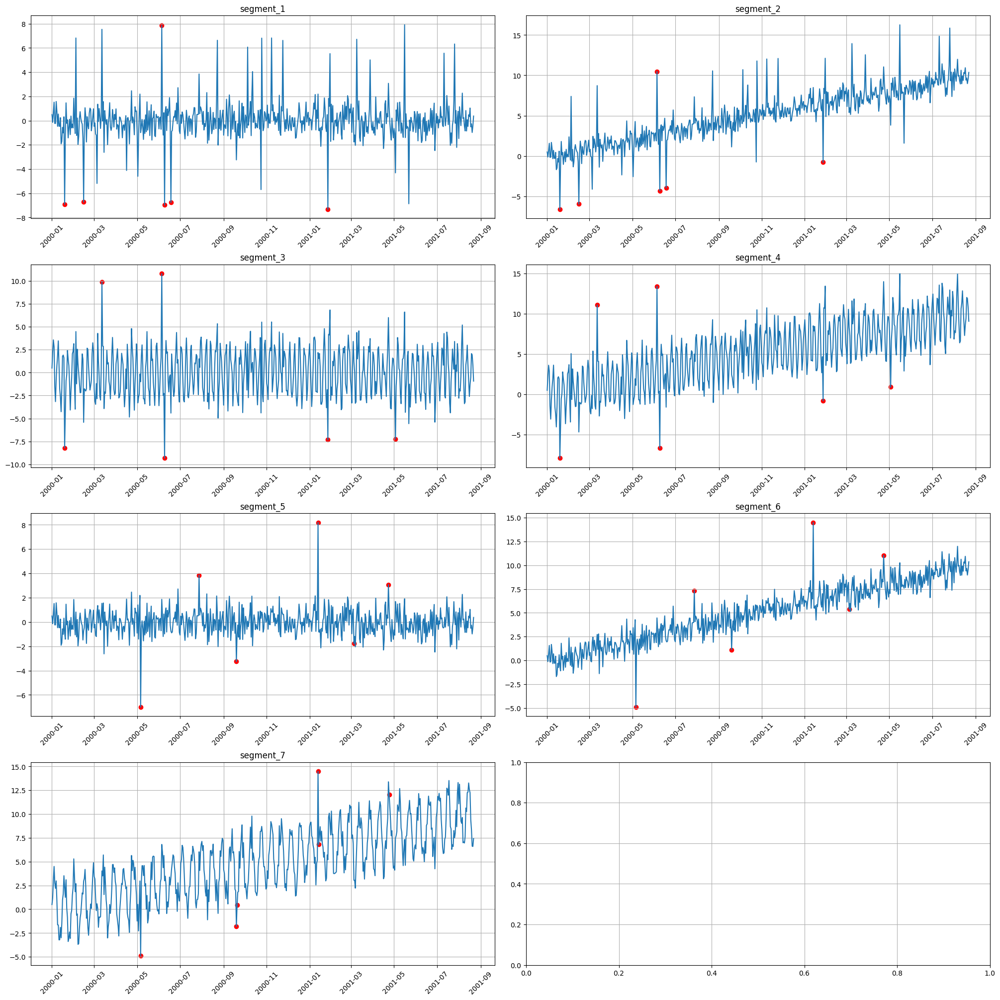

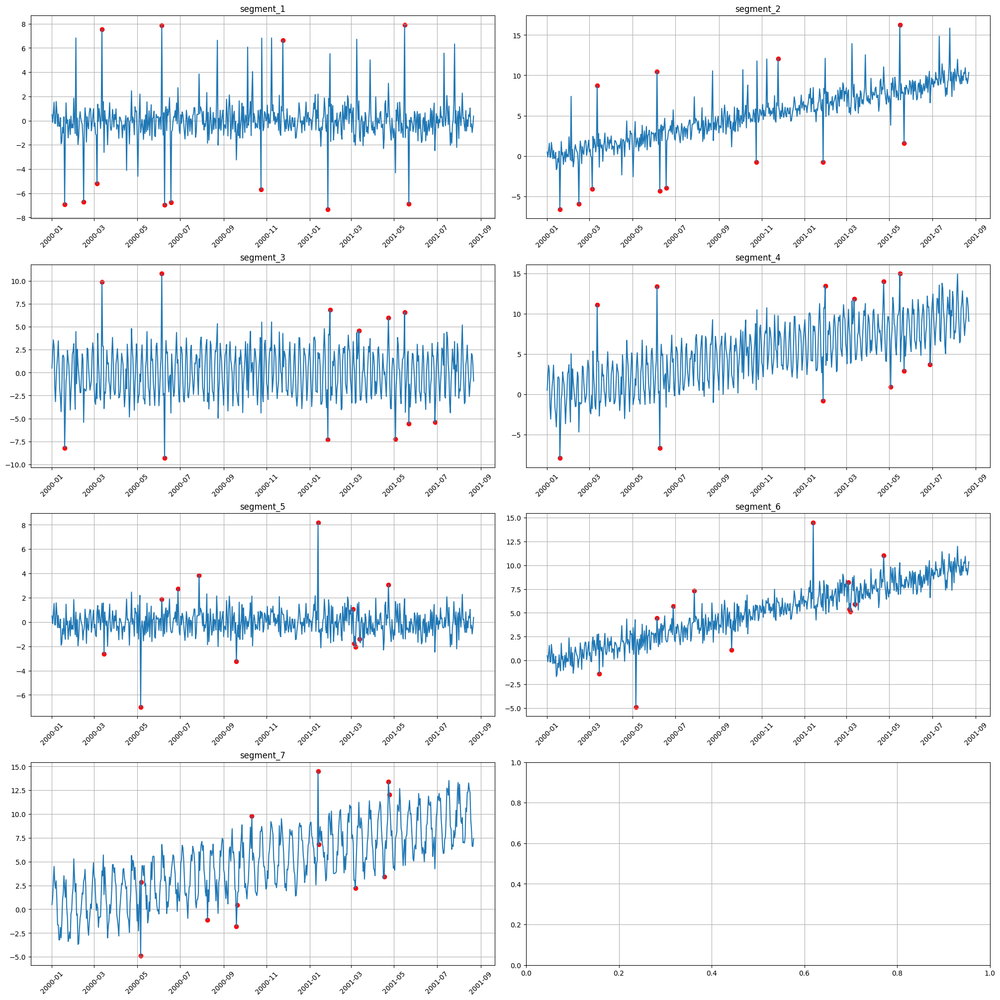

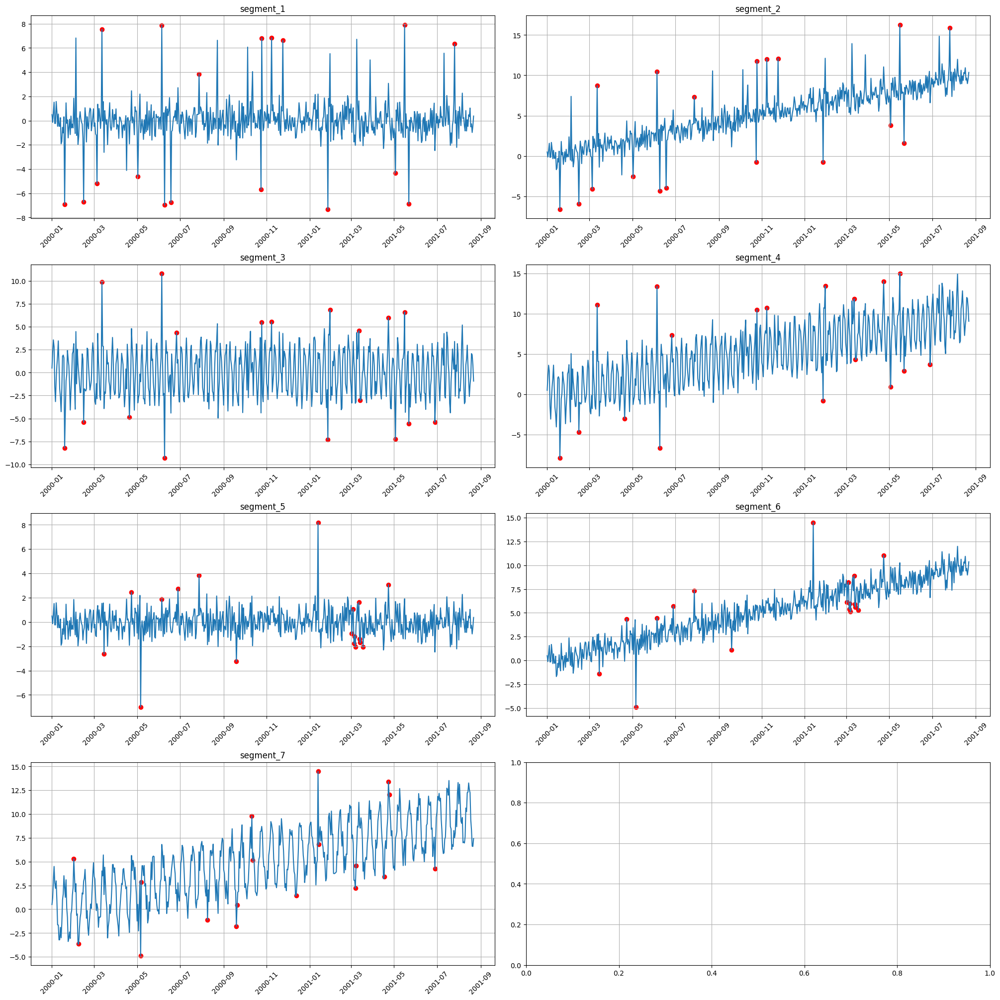

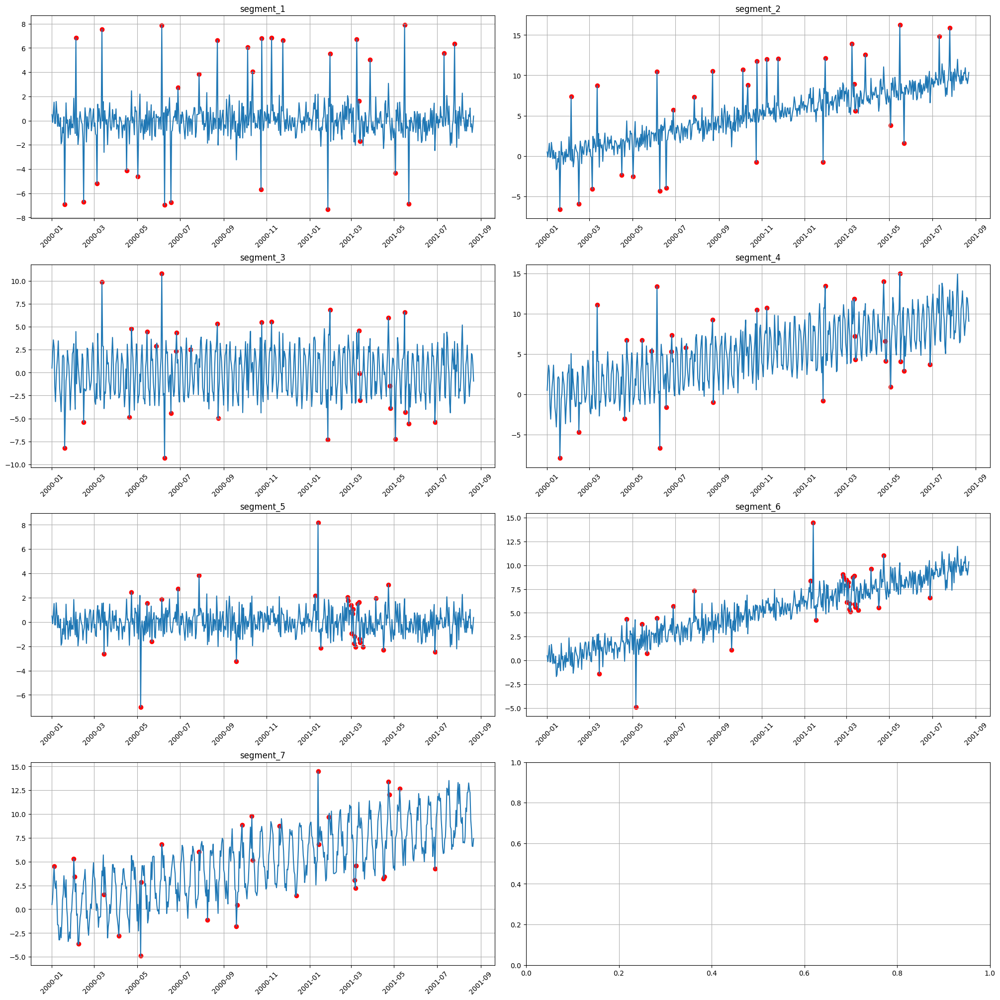

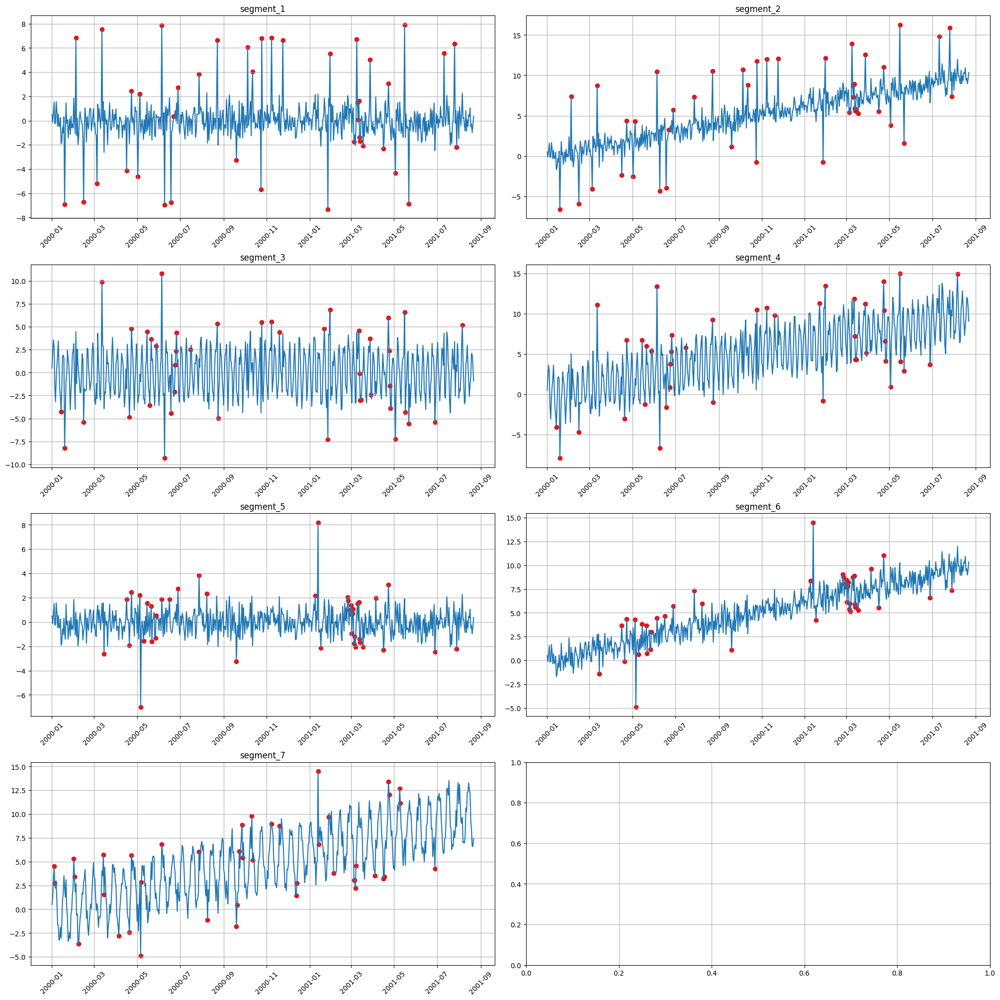

...

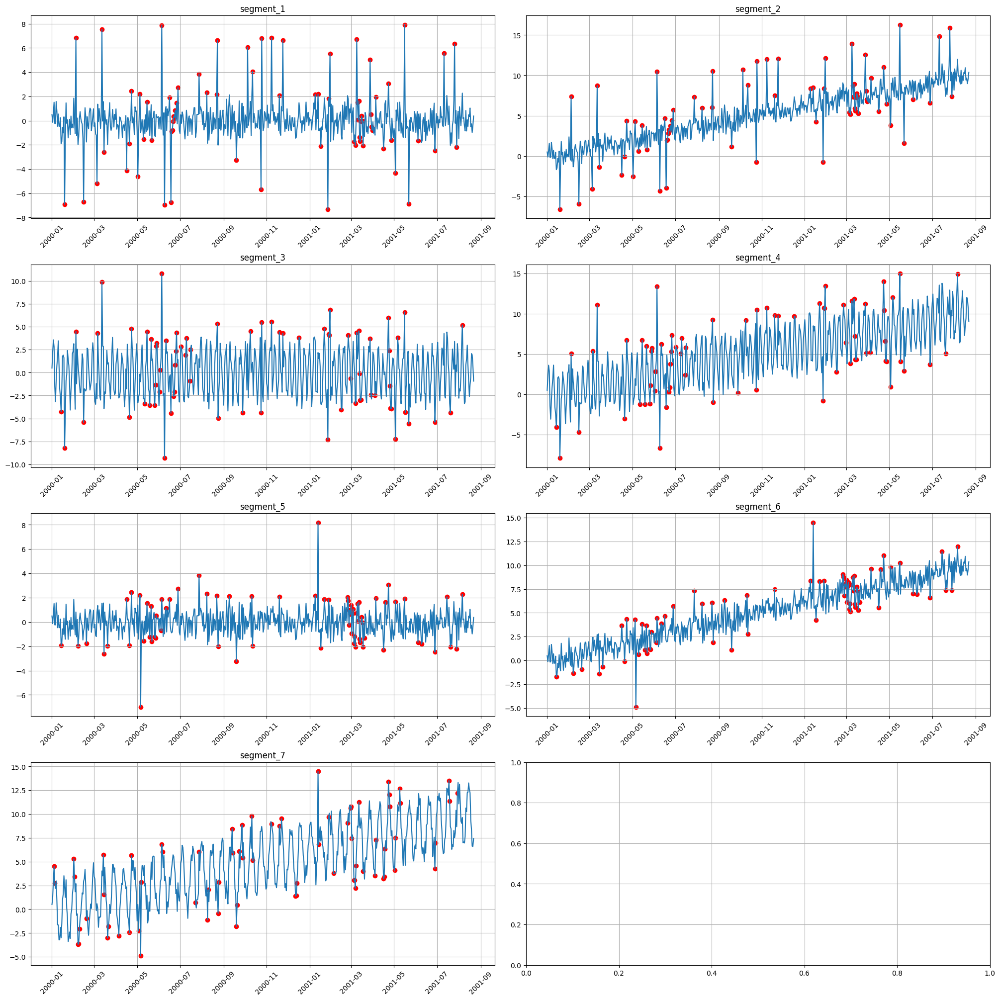

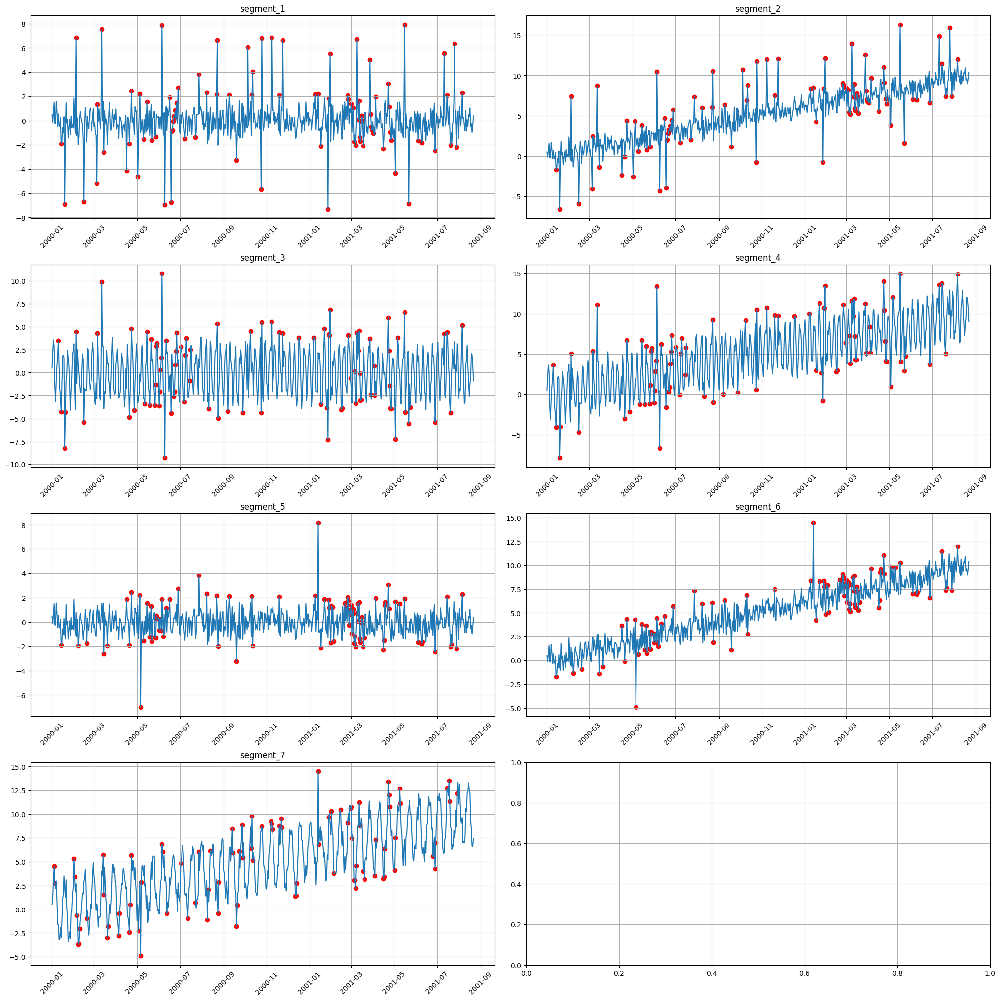

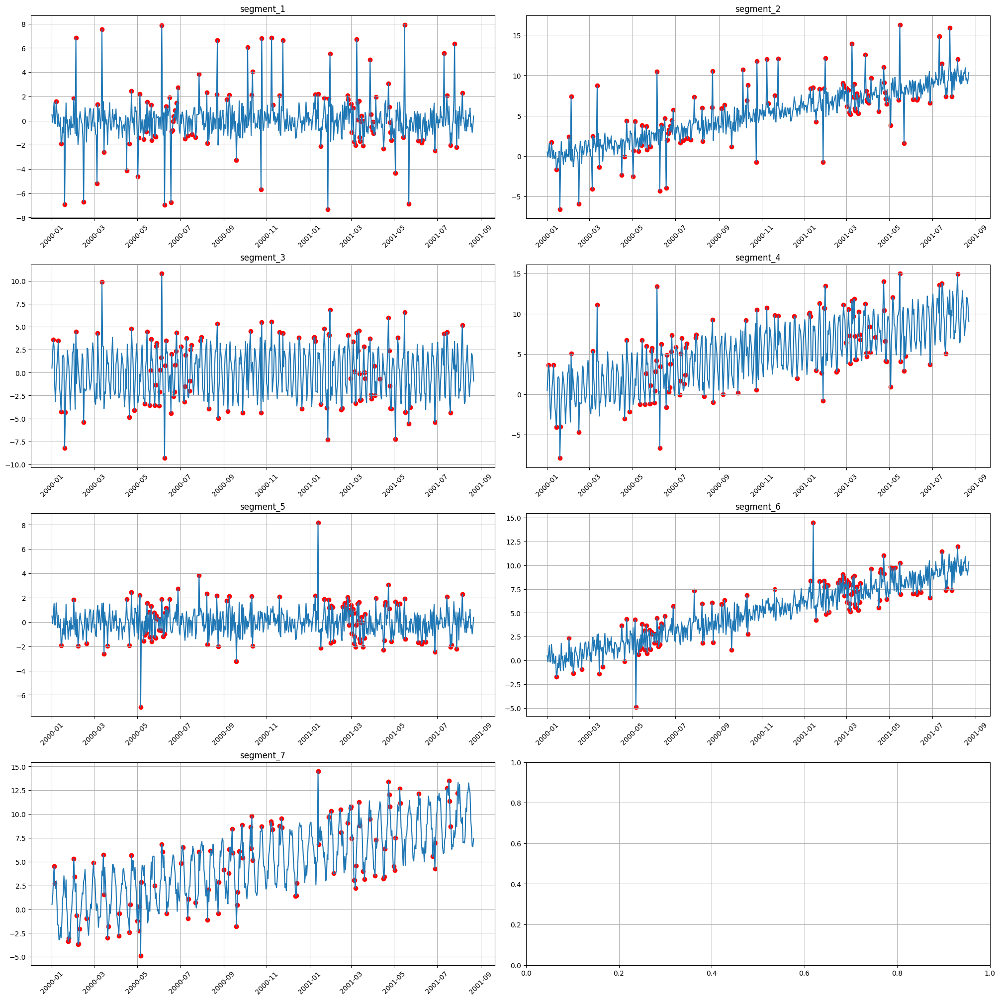

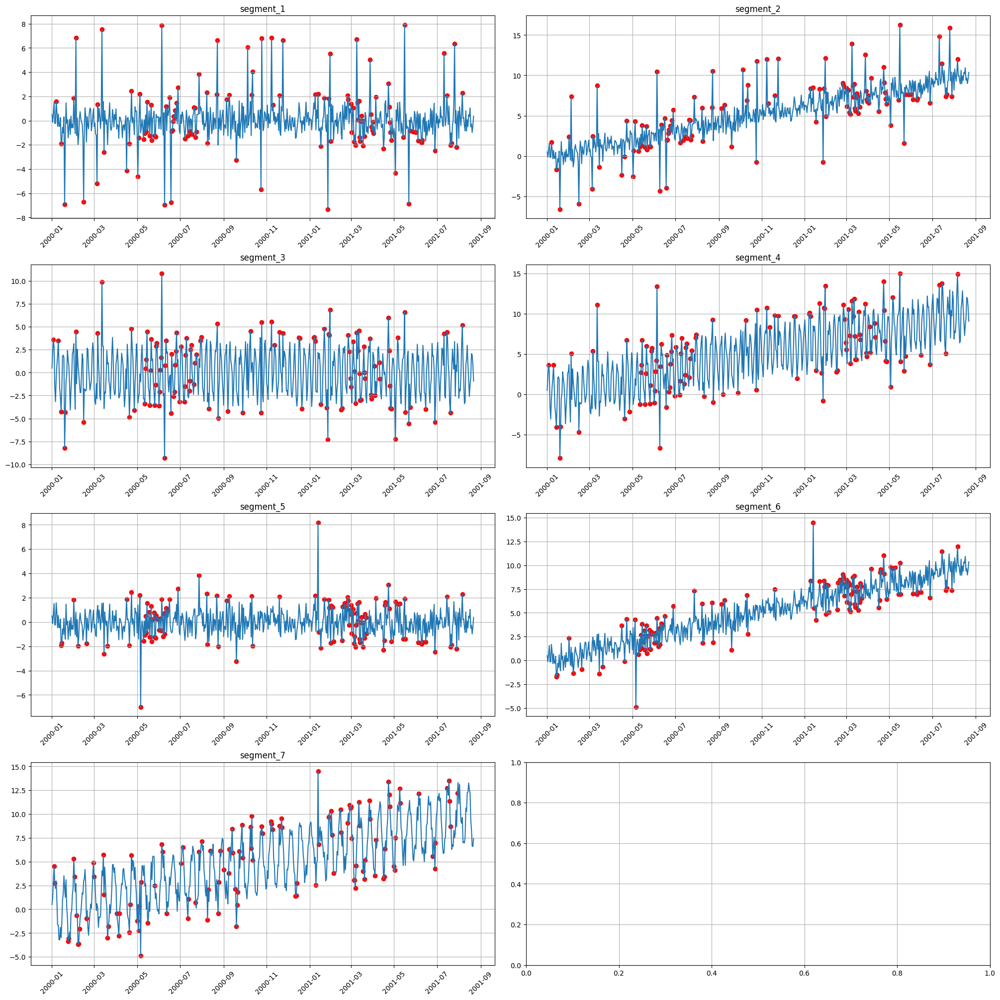

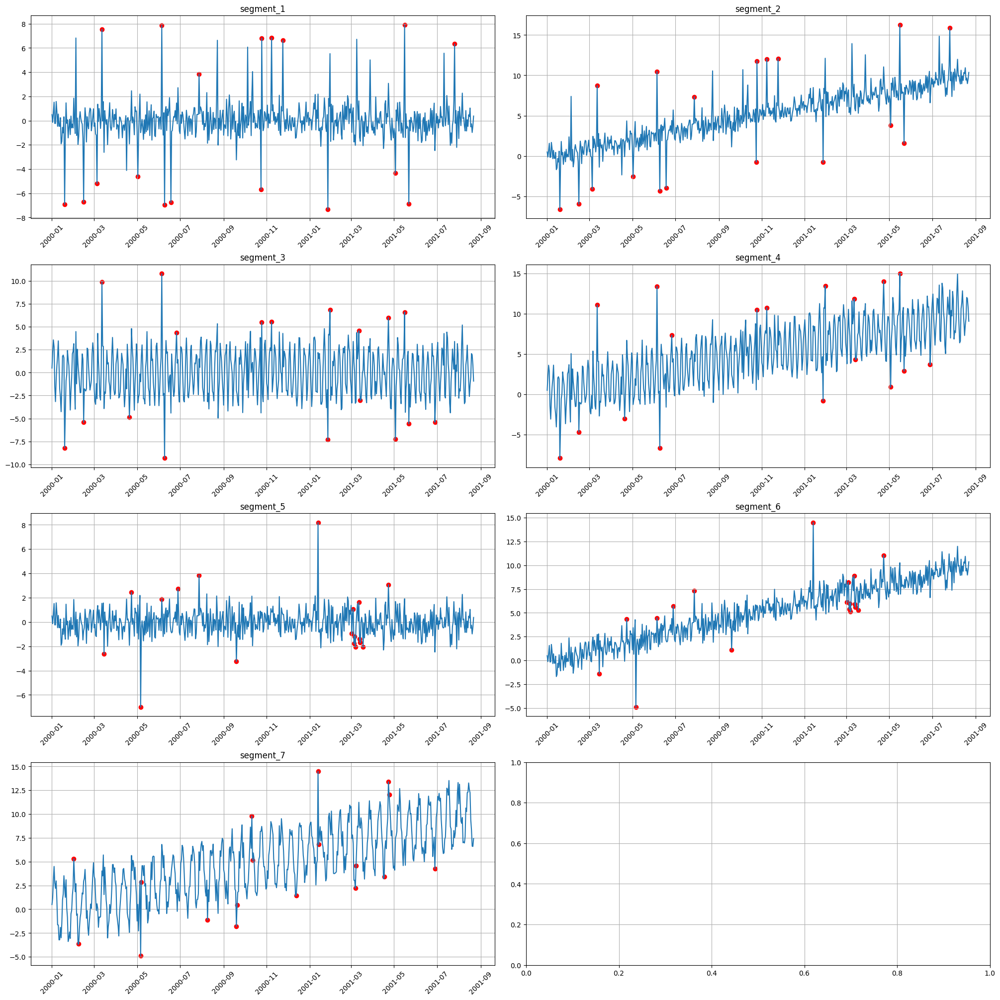

In [13]:
# IMPORTANT: in your ETNA version ts initially contains only feature=target.
# To get extra features for IsolationForest we should apply transforms to a COPY of ts.

from etna.transforms import LinearTrendTransform, ModelDecomposeTransform
from etna.models import HoltWintersModel
from copy import deepcopy

ts_feat = deepcopy(ts)
trend_transform = LinearTrendTransform(in_column="target")
decompose_transform = ModelDecomposeTransform(
    model=HoltWintersModel(), in_column="target"
)
ts_feat.fit_transform([trend_transform, decompose_transform])

df_feat = ts_feat.to_pandas()
features = sorted(set(df_feat.columns.get_level_values("feature")))  # <your code here>

import inspect

# --- Tune IsolationForest hyperparameters to improve F1 ---
sig = inspect.signature(get_anomalies_isolation_forest)
supports_model_params = "model_params" in sig.parameters

best_f1 = -1.0
best_conf = None
best_anomaly_dict = None

# contamination controls expected outlier fraction; it strongly affects precision/recall tradeoff
for contamination in [0.01, 0.02, 0.03, 0.05, 0.07, 0.10, 0.12, 0.15, 0.18, 0.20]:
    kwargs = dict(ts=ts_feat, features_to_use=features, random_state=4)
    if supports_model_params:
        kwargs["model_params"] = {"contamination": contamination}
    else:
        # fallback: some versions may expose contamination directly
        if "contamination" in sig.parameters:
            kwargs["contamination"] = contamination
        else:
            # cannot tune in this ETNA version
            pass

    anomaly_dict_tmp = get_anomalies_isolation_forest(**kwargs)
    _, metrics_agg_tmp, _ = eval_etna(df, anomaly_dict_tmp)
    f1 = float(metrics_agg_tmp["f1_score"])

    if f1 > best_f1:
        best_f1 = f1
        best_conf = contamination
        best_anomaly_dict = anomaly_dict_tmp

anomaly_dict = best_anomaly_dict
metrics_if_feat, metrics_agg_if_feat, anomalies_if_feat = eval_etna(df, anomaly_dict)
print({"best_contamination": best_conf, "best_f1": best_f1})
metrics_agg_if_feat

In [14]:
result = {
    "if_feat_f1_score": metrics_agg_if_feat["f1_score"],  # >= 0.29
}
print(json.dumps(result))

{"if_feat_f1_score": 0.4623376623376624}


# Part(2): Подбираем гиперпараметры под задачу прогнозировани (60 баллов)


In [15]:
import warnings

warnings.filterwarnings("ignore")

# Отключим логирование в Prophet

import logging

logging.getLogger("prophet").setLevel(logging.WARNING)
logging.getLogger("cmdstanpy").disabled = True

seed_everything(1234)

In [16]:
# Параметры кросс-валидации

from etna.metrics import SMAPE

HORIZON = 31
N_FOLDS = 3


def eval_pipeline(pipeline):
    metrics_df = pipeline.backtest(
        ts=ts, n_folds=N_FOLDS, metrics=[SMAPE()], aggregate_metrics=True
    )["metrics"]
    return metrics_df["SMAPE"].mean()

## Загрузка данных

В этом задании мы попробуем улучшить качество модели прогнозирования засчет удаления аномалий из обучающего датасета

Для начала загрузим чистые данные и построим на них базовый пайплайн


In [17]:
import pandas as pd
from etna.datasets.tsdataset import TSDataset
from etna.pipeline import Pipeline
from etna.models import ProphetModel

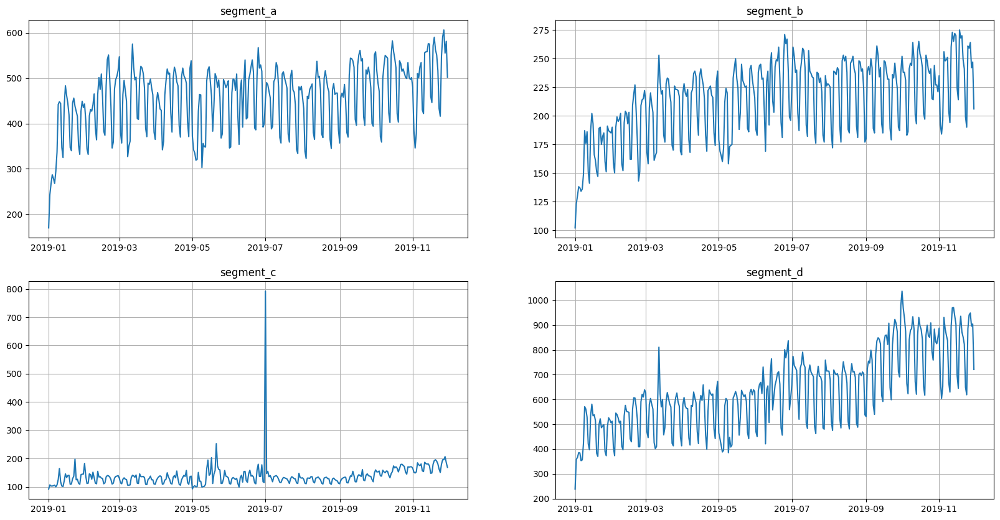

In [18]:
df = pd.read_csv(
    "https://raw.githubusercontent.com/etna-team/etna/refs/heads/master/examples/data/example_dataset.csv"
)
ts = TSDataset(df=df, freq="D")
ts.plot()

Можем считать, что это базовая метрика, к которой мы дальше будем стремиться


In [19]:
base_pipeline = Pipeline(model=ProphetModel(), transforms=[], horizon=HORIZON)
base_metric = eval_pipeline(base_pipeline)
{"base_metric": base_metric}

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.5s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    3.4s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.4s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s finished


{'base_metric': 8.443152186977928}

## Загрузка данных с аномалиями

Каким-то неизвестным образом в обучающей части датасета появились аномалии(их в целом видно на картинке). Давайте оценим насколько испортилась модель в их присутствии

**Важно:** на тестовой части датасета(где оценивается метрика) аномалий нет


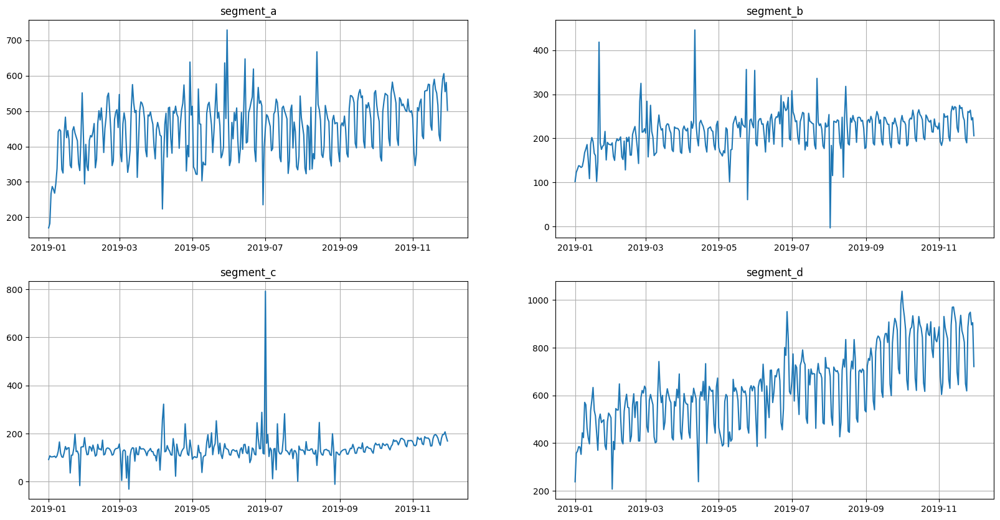

In [20]:
df = pd.read_csv(
    "https://gist.githubusercontent.com/alex-hse-repository/d16b214d2a1163a98d4af3abbe802894/raw/c71f2683d0e273ba1ad959b05df422e0a046ae7a/example_dataset_with_anomalies.csv"
)
ts = TSDataset(df=df, freq="D")
ts.plot()

Метрика стала чуть хуже -- в основной части задания вашей задачей будет это исправить


In [21]:
base_pipeline = Pipeline(model=ProphetModel(), transforms=[], horizon=HORIZON)
base_metric_with_anomalies = eval_pipeline(base_pipeline)
{"base_metric_with_anomalies": base_metric_with_anomalies}

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    2.2s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s finished


{'base_metric_with_anomalies': 8.654981544766464}

## Удаление аномалий с дефолтными гиперпараметрами

Попробуем несоклько методов поиска точечных аномалий, которые разбирались на лекции:

- `MedianOutliersTransform` -- в окне оцениваются параметры номарльного распределения, все что выходит за $median + alpha * std$ аномалии
- `DensityOutliersTransform` -- для каждой точки строится несколько окон в центром с ней $y + alpha * std$, если ни в одном окне нет хотябы $n\_neighbors$ соседей точка считается аномалией
- `PredictionIntervalOutliersTransform` -- все что выходит за доверительные интервалы пронозной модели аномалии

С помощью `*OutliersTransform` можно найти и заменить точечные аномалии на `NaN`. Для некоторых моделей получившиеся пропуски необходимо заполянть, однако Prophet умеет работать с пропущенными значениями -- поэтому сфокусируемся только на поиске аномалий

Постройте пайплайн с выделением аномалий через 3 данных метода с дефолтными гиперпараметрами и оцените качество прогнозов


In [22]:
from etna.transforms import (
    MedianOutliersTransform,
    DensityOutliersTransform,
    PredictionIntervalOutliersTransform,  # используйте model="prophet"
)

In [23]:
default_transforms = {
    "median": MedianOutliersTransform(in_column="target"),  # 8.45
    "density": DensityOutliersTransform(in_column="target"),  # 8.54
    "prediction_intervals": PredictionIntervalOutliersTransform(
        in_column="target", model="prophet"
    ),  # 7.76
}
default_metrics = {}
for name, transform in default_transforms.items():
    default_pipeline = Pipeline(
        model=ProphetModel(), transforms=[transform], horizon=HORIZON
    )
    default_metrics["default_" + name] = eval_pipeline(default_pipeline)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    2.6s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.5s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    2.8s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.

In [24]:
print(json.dumps(default_metrics))

{"default_median": 8.464368800936747, "default_density": 8.535399118271524, "default_prediction_intervals": 8.038422444095902}


## Подберите гиперпараметры

Теперь подберем отпимальные гиперпараметры наших методов(методы чувствительны к значениям гиперпараметров). На лекции качество методов оценивалось через классификационные метрики, однако в данном случае у нас нет на руках разметки. Предлагается подобрать гиперпараметры вторым методом -- по качеству решения задачи прогнозирования.

Для этого будем использовать механику перебора гиперпараметров на базе Optuna(подробнее тут https://github.com/etna-team/etna/blob/master/examples/205-automl.ipynb)


In [25]:
from etna.distributions import (
    FloatDistribution,
    IntDistribution,
    CategoricalDistribution,
)
from etna.auto import Tune

In [26]:
def get_best_params(pipeline, params_to_tune):
    tune = Tune(
        pipeline=pipeline,
        target_metric=SMAPE(),
        horizon=HORIZON,
        backtest_params=dict(n_folds=3),
        params_to_tune=params_to_tune,
    )
    best_pipeline = tune.fit(ts=ts, n_trials=10, catch=(Exception,))
    best_metic = tune.summary()["SMAPE_mean"].min()
    return best_pipeline, best_metic

In [27]:
params_to_tune = {
    "median": {  # 8.31
        "transforms.0.window_size": IntDistribution(low=3, high=30, step=1, log=False),
        "transforms.0.alpha": FloatDistribution(
            low=1.0, high=10.0, step=0.25, log=False
        ),
    },
    "density": {  # 8.44
        "transforms.0.window_size": IntDistribution(low=5, high=40, step=1, log=False),
        "transforms.0.distance_coef": FloatDistribution(
            low=1.0, high=10.0, step=0.25, log=False
        ),
        "transforms.0.n_neighbors": IntDistribution(low=1, high=10, step=1, log=False),
    },
    "prediction_intervals": {  # 7.75
        "transforms.0.interval_width": FloatDistribution(
            low=0.8, high=0.99, step=0.01, log=False
        ),
        "transforms.0.model": CategoricalDistribution(choices=["prophet"]),
    },
}

tuned_pipelines = {}
tuned_metrics = {}
for name, params in params_to_tune.items():
    pipeline = Pipeline(
        model=ProphetModel(), transforms=[default_transforms[name]], horizon=HORIZON
    )
    best_pipeline, best_metric = get_best_params(pipeline, params)
    tuned_pipelines["tuned_" + name] = best_pipeline
    tuned_metrics["tuned_" + name] = best_metric

[I 2025-12-25 21:15:13,064] A new study created in RDB with name: no-name-4e0012ed-2ba8-4140-bf2d-386467109e4d
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.4s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s finished
[I 2025-12-25 21:15:18,307] Trial 0 finished with value: 8.654981544766464 and parameters: {'transforms.0.window_size': 18, 'trans

In [28]:
print(json.dumps(tuned_metrics))

{"tuned_median": 8.262664583519701, "tuned_density": 8.457845559545554, "tuned_prediction_intervals": 7.672609332823578}


## Визуализируйте аномалии при оптимальных гиперпараметрах

Для того чтобы дополнительно убедиться что в итоге подобрались адекватные гиперпараметры, давайте визуализируем результаты


In [29]:
from etna.analysis import plot_anomalies
from etna.analysis import (
    get_anomalies_median,
    get_anomalies_density,
    get_anomalies_prediction_interval,
)

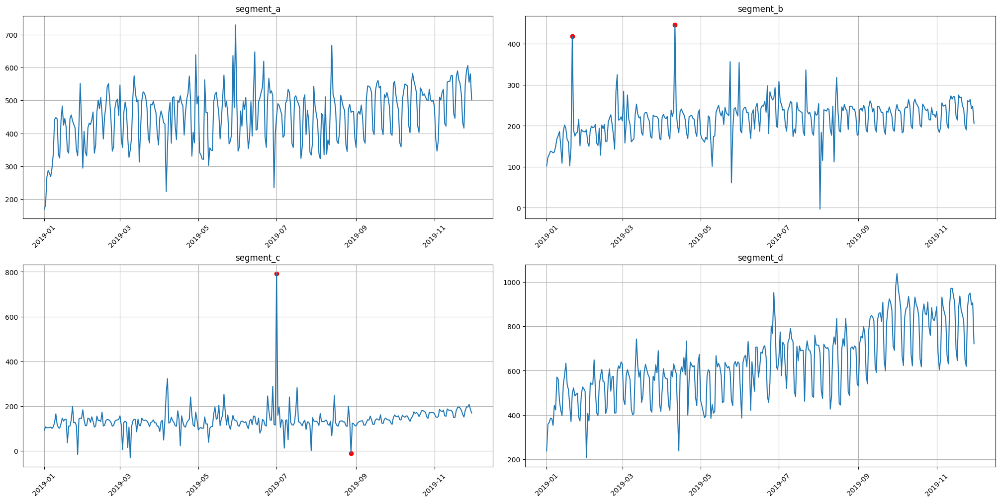

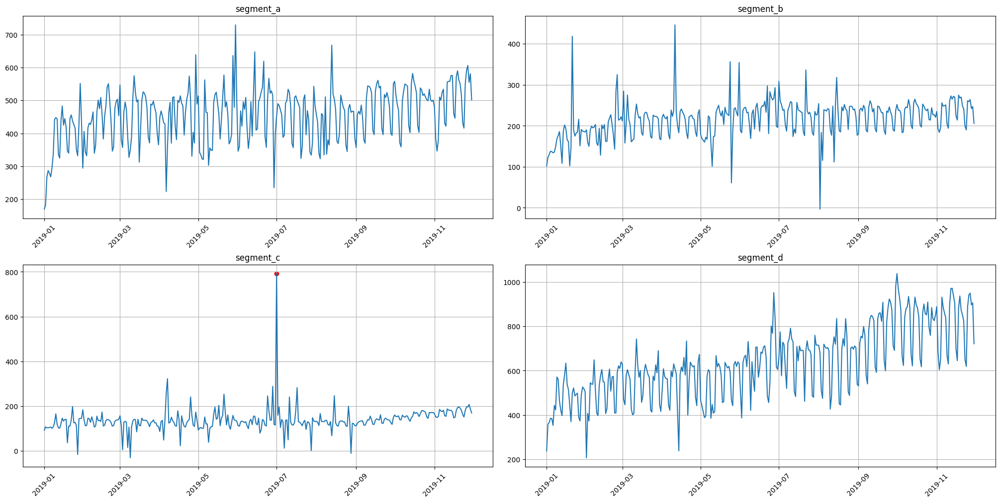

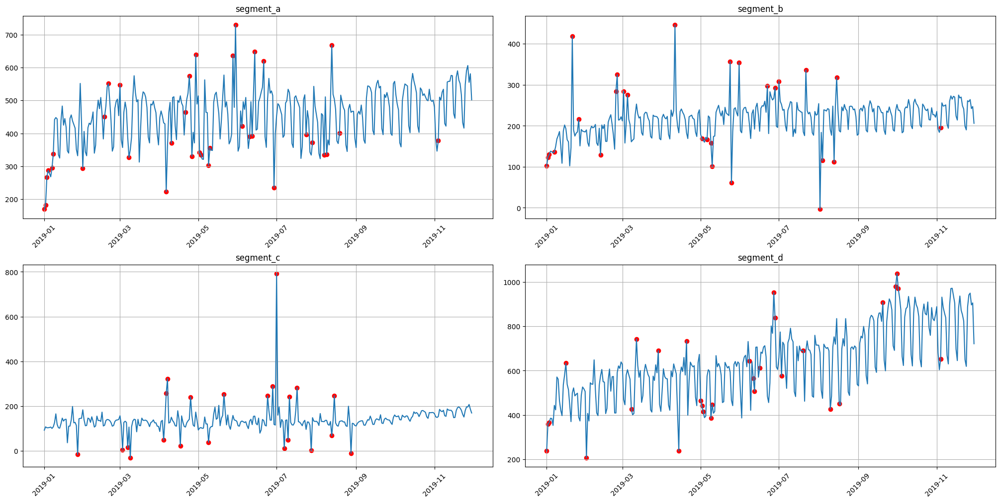

In [30]:
# Визуализируем аномалии при оптимальных гиперпараметрах

# Median
median_tr = tuned_pipelines["tuned_median"].transforms[0]
anoms_median = get_anomalies_median(
    ts=ts,
    in_column=median_tr.in_column,
    window_size=median_tr.window_size,
    alpha=median_tr.alpha,
)
plot_anomalies(ts, anoms_median)

# Density
density_tr = tuned_pipelines["tuned_density"].transforms[0]
anoms_density = get_anomalies_density(
    ts=ts,
    in_column=density_tr.in_column,
    window_size=density_tr.window_size,
    distance_coef=density_tr.distance_coef,
    n_neighbors=density_tr.n_neighbors,
    distance_func=density_tr.distance_func,
)
plot_anomalies(ts, anoms_density)

# Prediction intervals
pi_tr = tuned_pipelines["tuned_prediction_intervals"].transforms[0]
anoms_pi = get_anomalies_prediction_interval(
    ts=ts,
    in_column=pi_tr.in_column,
    model=ProphetModel,
    interval_width=pi_tr.interval_width,
)
plot_anomalies(ts, anoms_pi)